In [1]:
import numpy as np
import pandas as pd
import altair as alt
import re
from vega_datasets import data
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

In [2]:
df = pd.read_csv('bollywood_full.csv')

In [3]:
# Droping columns which i will not be using for analysis
df = df.drop(['title_x','title_y', 'imdb_id', 'poster_path', 'wiki_link', 'is_adult', 'tagline', 'release_date'], axis=1)

# Renaming for ease of reference
df = df.rename(columns={'original_title': 'title', 'year_of_release':'year', 'imdb_rating':'rating', 'imdb_votes':'votes', 'wins_nominations':'awards'})

In [4]:
# Data cleaning
df['awards'] = df['awards'].apply(lambda x: re.sub(r'[A-Za-z]', '', str(x)))
df[['wins', 'nominations']] = df.awards.str.split('&', expand=True)
df['wins'] = df['wins'].str.strip()
df['wins'] = df['wins'].apply(lambda x: 0 if x=='' else x)
df['wins'] = df['wins'].replace(np.nan, 0)
df['wins'] = df['wins'].astype(int)

df['runtime'] = df['runtime'].replace('\\N', np.nan)
df['runtime'] = df['runtime'].ffill()
df['runtime'] = df['runtime'].astype(int)
df = df[df['runtime'] >= 60]

actors = df.actors.str.split('|', expand=True)
df['lead_actor'] = actors[0]

df[['genre','genre2', 'genre3']] = df.genres.str.split("|",expand=True)
df = df.drop(['genres', 'awards', 'actors', 'genre2', 'genre3', 'nominations'], axis=1)
minor_genre_list = ['Animation','Documentary','History','Music','War','Sci-Fi','Sport']
df = df[~df['genre'].isin(minor_genre_list)]

df = df.drop_duplicates()

### Scatter plot of movies by year

In [5]:
alt.Chart(df, title='Bollywood movies released over the years').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('id:O', axis=None, sort='descending'),
    tooltip=['title', 'year', 'rating'],
    color='genre'
).properties(height=600, width=800)

alt.Chart(...)

### Stacked bar chart of genre by year

In [6]:
temp1 = df.groupby(['genre', 'year']).size().reset_index(name='count')

In [7]:
alt.Chart(temp1, title='Bollywood movies genre over the years').mark_bar(opacity=0.8).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1955, 2015])),
    alt.Y('count', stack='zero'),
    color='genre',
    tooltip=['genre']
).properties(height=500, width=800)

alt.Chart(...)

### All them winners

In [8]:
winners = df[df['wins']!=0]

In [9]:
alt.Chart(winners, title='Award winning movies over the years').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('id:O', axis=None, sort='descending'),
    tooltip=['title', 'year'],
    color='genre'
).properties(height=600, width=800)

alt.Chart(...)

#### Does movie that win multiple records also have high ratins

In [10]:
alt.Chart(winners[winners['wins']>5], title='Multiple award winning movies over the years').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('rating', scale=alt.Scale(type='linear', domain=[0, 10])),
    tooltip=['title', 'year'],
    color='genre'
).properties(height=600, width=800)

alt.Chart(...)

In [11]:
alt.Chart(winners[winners['wins']>=5], title='Movies that won more than 5 award with rating and votes').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('votes', scale=alt.Scale(type='log', domain=[10, 1000000])),
    tooltip=['title', 'year', 'votes'],
    color='genre'
).properties(height=600, width=800)

alt.Chart(...)

#### Who is the actor with multiple appeearence in award winning movies

In [12]:
temp2 = winners.lead_actor.value_counts().head(10).rename_axis('actor').reset_index(name='appearences')
alt.Chart(temp2, title='Lead actor with most appearnces in award winning movies').mark_bar().encode(
    alt.X('actor', axis=alt.Axis(labelAngle=-45)),
    alt.Y("appearences")
).properties(width=600)

alt.Chart(...)

#### Award winning movies over the years

In [13]:
temp3 = winners[winners['lead_actor'].isin(temp2.actor.tolist())]

In [14]:
alt.Chart(temp3, title='Award winning Movies of Top actors').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('rating', scale=alt.Scale(type='linear', domain=[0, 10])),
    tooltip=['title', 'year', 'rating','genre'],
    color='lead_actor'
).properties(height=600, width=800)

alt.Chart(...)

#### What is Succes percentage of top actors

In [15]:
movies_done_by_top_actors = df[df['lead_actor'].isin(temp3.lead_actor.tolist())]

In [16]:
success_percentage = (temp3.lead_actor.value_counts() / movies_done_by_top_actors.lead_actor.value_counts() * 100).rename_axis('actor').reset_index(name='% success')

In [17]:
alt.Chart(success_percentage, title='What is success percentage of top actors').mark_bar().encode(
    alt.X('actor', axis=alt.Axis(labelAngle=-45)),
    alt.Y("% success")
).properties(width=600)

alt.Chart(...)

### What does movie runtime tells us about the movie

In [18]:
temp4 = df.groupby(['year'])['runtime'].mean().reset_index(name='avg_runtime')
alt.Chart(temp4, title='Average runtime of movie over the years').mark_area(
    line={'color':'darkblue'},
    color=alt.Gradient(
        gradient='linear',
        stops=[alt.GradientStop(color='white', offset=0),
               alt.GradientStop(color='darkblue', offset=1)],
        x1=1,
        x2=1,
        y1=1,
        y2=0
    )
).encode(
    alt.X('year'),
    alt.Y('avg_runtime')
).properties(height=300, width=800)

alt.Chart(...)

#### Is there a sweet spot of movie runtime that impact the ratings

In [19]:
alt.Chart(df, title='How rating varies with runtime').mark_circle().encode(
    alt.X('runtime', bin=alt.Bin(maxbins=20), scale=alt.Scale(type='linear', domain=[60, 220])),
    alt.Y('rating', bin=alt.Bin(maxbins=10)),
    size='count()'
).properties(height=300, width=800)

alt.Chart(...)

#### What are highest rated movies in every genre

In [20]:
temp5 = df.groupby(['year'])[['title','genre', 'rating']].max().reset_index()
alt.Chart(temp5, title='Highest rates movies of all years').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('rating', scale=alt.Scale(type='linear', domain=[0, 10])),
    tooltip=['title', 'year', 'rating','genre'],
    color='genre'
).properties(height=200, width=800)

alt.Chart(...)

### What does word cloud of summaries of movie tells us in all the genres

Action


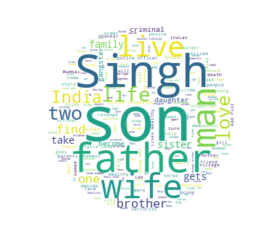

Adventure


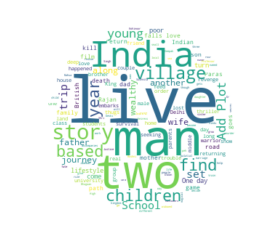

Biography


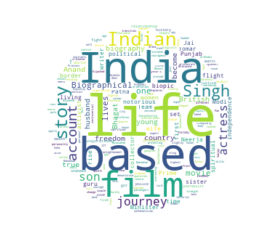

Comedy


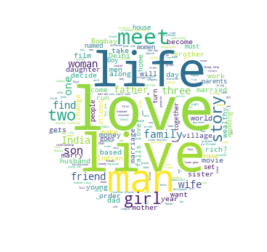

Crime


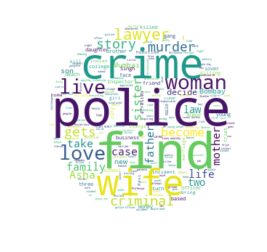

Drama


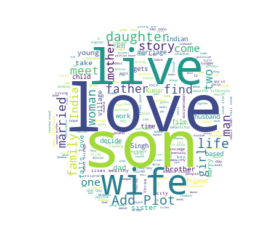

Family


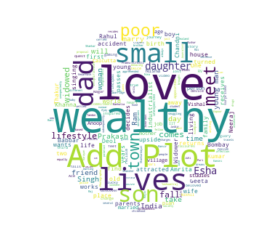

Fantasy


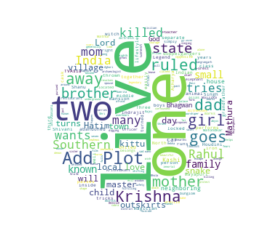

Horror


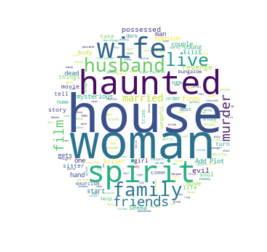

Musical


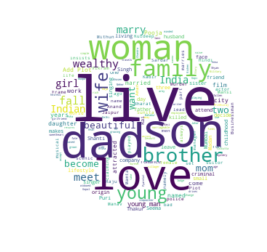

Mystery


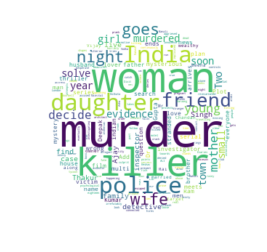

Romance


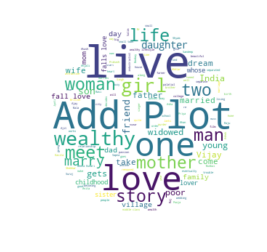

Thriller


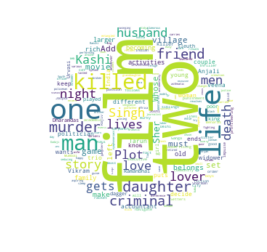

In [21]:
temp6 = df.groupby(['genre'])['summary']

x, y = np.ogrid[:300, :300]

mask = (x - 150) ** 2 + (y - 150) ** 2 > 130 ** 2
mask = 255 * mask.astype(int)

for name, group in temp6:
    text = ' '.join(group.tolist())
    wordcloud = WordCloud(width=500, height=500, margin=0,background_color ='white',
                          stopwords = stopwords, mask=mask)
    wordcloud = wordcloud.generate(text)
    print(name)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.margins(x=0, y=0)
    plt.show()

### Can we suggest movie based on it's plot

In [22]:
# we are going to use cosine similarity to find movies with similar plot
movie_recommend_df = df[['title', 'story']]
movie_recommend_df = movie_recommend_df.dropna(subset=['story'])
movie_recommend_df = movie_recommend_df.reset_index(level=0)
movie_recommend_df['id'] = movie_recommend_df['index']
movie_recommend_df = movie_recommend_df.drop(['index'], axis=1)

tf = TfidfVectorizer(analyzer='word', min_df=1, max_features= 200 ,stop_words='english', lowercase=True)
tfidf_matrix = tf.fit_transform(movie_recommend_df['story'])

cosine_similarities = linear_kernel(tfidf_matrix, tfidf_matrix)
results = {}

for idx, row in movie_recommend_df.iterrows():
    similar_indices = cosine_similarities[idx].argsort()[:-50:-1]
    similar_items = [(cosine_similarities[idx][i], movie_recommend_df['id'][i]) for i in similar_indices]
    results[row['id']] = similar_items[1:]

In [23]:
def item(id):
    return movie_recommend_df.loc[movie_recommend_df['id'] == id]['title']

def recommend(id, num):
    print("Recommending " + str(num) + " movie similar to " + item(id))
    recs = results[id][:num]
    i=0
    for rec in recs:
        print("We recommend : " + item(rec[1]) + " (score:" + str(rec[0]) + ")")

In [24]:
recommend(1787,3)

1733    Recommending 3 movie similar to Gunda
Name: title, dtype: object
3415    We recommend : Shor (score:0.6807425843664299)
Name: title, dtype: object
3877    We recommend : Tumsa Nahin Dekha (score:0.6554...
Name: title, dtype: object
3073    We recommend : Sone Ka Dil Lohe Ke Haath (scor...
Name: title, dtype: object
